In [5]:
import pandas as pd
import numpy as np
from pandas import DataFrame as df

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Import Data

### JSON Dataset

In [3]:
dataf = pd.read_json("db.json")
dataf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4 entries, FSWJzuEM0ZTPZWV6tqSslNwVgRY2 to hJ7u88Lv5VQemTa6PXiE8dGYpTS2
Data columns (total 1 columns):
users    4 non-null object
dtypes: object(1)
memory usage: 64.0+ bytes


### CSV Dataset

In [3]:
dataf = pd.read_csv("db.csv")
dataf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4 entries, FSWJzuEM0ZTPZWV6tqSslNwVgRY2 to hJ7u88Lv5VQemTa6PXiE8dGYpTS2
Data columns (total 1 columns):
users    4 non-null object
dtypes: object(1)
memory usage: 64.0+ bytes


### XML Dataset

In [6]:
dataf = df() #to be completed
dataf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Empty DataFrame

# Data exploration

In [5]:

records.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5739 entries, -LYBdZxt7XnyT0fRwhsP to -LQ1h55GEP2-8kY7Lham
Data columns (total 13 columns):
activity       5739 non-null int64
battery        5739 non-null int64
core8          5739 non-null object
date           5739 non-null object
day            5739 non-null int64
heater         5739 non-null object
intensity      5739 non-null int64
operation      5739 non-null object
power          5739 non-null int64
shirt          5738 non-null object
steps          5739 non-null int64
temperature    5739 non-null object
time           5739 non-null int64
dtypes: int64(7), object(6)
memory usage: 627.7+ KB


In [6]:
records.describe()

,activity,battery,day,intensity,power,steps,time
count,5739.000000,5739.000000,5739.000000,5739.000000,5739.000000,5739.000000,5.739000e+03
mean,0.894581,56.466980,739.191323,8.773131,0.983098,0.078062,1.547133e+09
std,0.364708,30.890322,412.075801,36.635898,1.485222,0.618782,3.560435e+07
min,0.000000,10.000000,-17167.000000,0.000000,0.000000,0.000000,1.500000e+01
25%,1.000000,20.000000,768.000000,4.000000,0.000000,0.000000,1.549626e+09
50%,1.000000,60.000000,768.000000,4.000000,0.000000,0.000000,1.549637e+09
75%,1.000000,90.000000,774.000000,5.000000,2.000000,0.000000,1.550135e+09
max,5.000000,100.000000,774.000000,842.000000,4.000000,9.000000,1.550155e+09


In [7]:
allrecords = allrecords.drop(columns=['core8', 'shirt', 'date', 'day'])
allrecords = pd.concat([allrecords, allrecords['heater'].apply(pd.Series)], axis=1)
allrecords = allrecords.rename(columns={'0': 'heat_front', '1': 'heat_back'})
allrecords = pd.concat([allrecords, allrecords['operation'].apply(pd.Series)], axis=1)
allrecords = allrecords.rename(columns={'0': 'operation_front', '1': 'operation_back'})
allrecords = pd.concat([allrecords, allrecords['temperature'].apply(pd.Series)], axis=1)
allrecords = allrecords.rename(columns={'0': 'temperature_front', '1': 'temperature_back'})
allrecords = allrecords.drop(['heater', 'operation', 'temperature'], axis=1)

In [8]:
allrecords.describe()

,activity,battery,intensity,power,steps,time,operation_front,operation_back,temperature_front,temperature_back
count,5739.000000,5739.000000,5739.000000,5739.000000,5739.000000,5.739000e+03,5739.000000,5739.000000,5739.000000,5739.000000
mean,0.894581,56.466980,8.773131,0.983098,0.078062,1.547133e+09,0.173898,0.073880,3.237661,4.154970
std,0.364708,30.890322,36.635898,1.485222,0.618782,3.560435e+07,0.379055,0.261599,45.775021,46.033959
min,0.000000,10.000000,0.000000,0.000000,0.000000,1.500000e+01,0.000000,0.000000,-128.000000,-128.000000
25%,1.000000,20.000000,4.000000,0.000000,0.000000,1.549626e+09,0.000000,0.000000,10.375000,13.968750
50%,1.000000,60.000000,4.000000,0.000000,0.000000,1.549637e+09,0.000000,0.000000,19.500000,19.937500
75%,1.000000,90.000000,5.000000,2.000000,0.000000,1.550135e+09,0.000000,0.000000,21.625000,24.250000
max,5.000000,100.000000,842.000000,4.000000,9.000000,1.550155e+09,1.000000,1.000000,37.062500,35.875000


# Data visualization

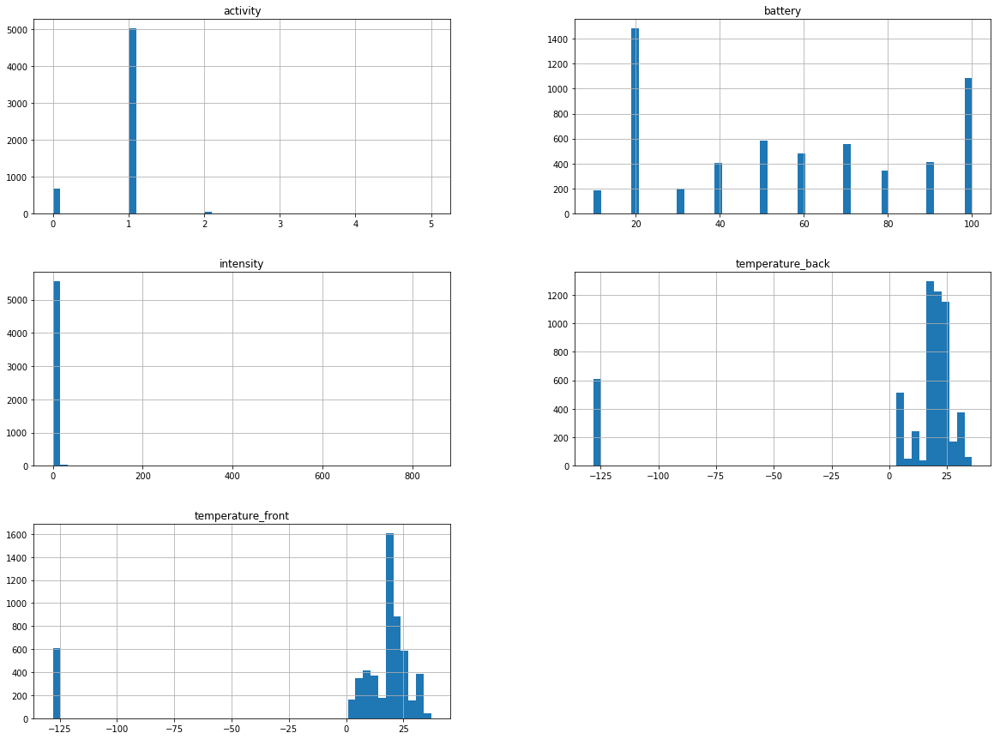

In [9]:
%matplotlib inline
import matplotlib.pyplot as plt
allrecords[['intensity', 'battery', 'activity', 'temperature_front', 'temperature_back']].hist(bins=50, figsize=(20,15))
plt.show()

# features correlations

In [10]:
corr_matrix = allrecords.corr()
corr_matrix["temperature_front"].sort_values(ascending=False)

temperature_front    1.000000
temperature_back     0.995472
activity             0.831576
heat_front           0.140156
heat_back            0.138813
operation_front      0.098269
intensity            0.086075
operation_back       0.072624
battery              0.050889
steps                0.045234
time                -0.030973
power               -0.719665
Name: temperature_front, dtype: float64

In [11]:
corr_matrix["heat_front"].sort_values(ascending=False)

heat_front           1.000000
operation_front      0.326148
heat_back            0.291196
operation_back       0.194826
temperature_back     0.168545
temperature_front    0.140156
activity             0.121602
battery              0.021678
intensity            0.008600
steps                0.002078
time                -0.000679
power               -0.290363
Name: heat_front, dtype: float64

In [12]:
corr_matrix["heat_back"].sort_values(ascending=False)

heat_back            1.000000
heat_front           0.291196
operation_back       0.251262
operation_front      0.212720
temperature_back     0.141775
temperature_front    0.138813
activity             0.107301
battery              0.049349
intensity            0.025237
steps                0.011360
time                -0.007315
power               -0.258630
Name: heat_back, dtype: float64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9b17d5da90>,
      dtype=object)

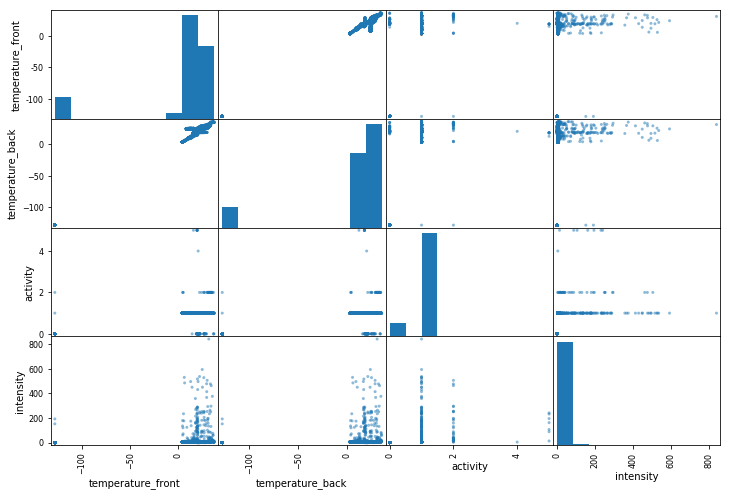

In [13]:
from pandas.tools.plotting import scatter_matrix
attributes = ["temperature_front", "temperature_back", "activity",
"intensity"]
scatter_matrix(allrecords[attributes], figsize=(12, 8))

## Model preparation

In [14]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(allrecords.drop(["heat_front", "heat_back"], axis=1),allrecords[["heat_front", "heat_back"]] , test_size=0.33, random_state=42)

In [15]:
from sklearn.ensemble import RandomForestRegressor
forest_reg = RandomForestRegressor()
forest_reg.fit(X_train, y_train)
print("Predictions:\t", forest_reg.predict(X_test))

Predictions:	 [[0.  0. ]
 [0.  0. ]
 [0.  0. ]
 ...
 [0.  0. ]
 [0.  0. ]
 [0.1 0. ]]


## DecisionTree viz exemple

In [16]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(forest_reg.estimators_[8], out_file='tree.dot', 
                feature_names = list(X_train),
                class_names = list(y_train),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

## Cross-validation

In [17]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(forest_reg, X_train, y_train,
scoring="neg_mean_squared_error", cv=10)
rmse_scores = np.sqrt(-scores)
print("Scores:", rmse_scores)
print("Mean:", rmse_scores.mean())
print("Standard deviation:", rmse_scores.std())

Scores: [0.18780602 0.19932267 0.19707884 0.20233907 0.20530672 0.19606809
 0.21316384 0.2252931  0.21002956 0.21005812]
Mean: 0.20464660282694386
Standard deviation: 0.010028229413126657


## Fine-Tune

In [18]:
from sklearn.model_selection import GridSearchCV
param_grid = [
{'n_estimators': [3, 10, 20, 30, 50], 'max_features': [2, 3, 4, 5, 6, 7, 8]},
{'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]},
]
forest_reg = RandomForestRegressor()
grid_search = GridSearchCV(forest_reg, param_grid, cv=10,
scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)
print("Best params:\t", grid_search.best_params_)
print("Best estimator:\t", grid_search.best_estimator_)

Best params:	 {'max_features': 6, 'n_estimators': 50}
Best estimator:	 RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=6, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=50, n_jobs=None, oob_score=False,
           random_state=None, verbose=0, warm_start=False)


In [19]:
cvres = grid_search.cv_results_
for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
    print(np.sqrt(-mean_score), params)

0.23554829748109235 {'max_features': 2, 'n_estimators': 3}
0.21091986893140144 {'max_features': 2, 'n_estimators': 10}
0.20925116421296705 {'max_features': 2, 'n_estimators': 20}
0.20499102311793385 {'max_features': 2, 'n_estimators': 30}
0.20388867196843288 {'max_features': 2, 'n_estimators': 50}
0.22824772408834632 {'max_features': 3, 'n_estimators': 3}
0.20738461805381034 {'max_features': 3, 'n_estimators': 10}
0.20358246032977495 {'max_features': 3, 'n_estimators': 20}
0.20322264599199322 {'max_features': 3, 'n_estimators': 30}
0.2005684695380021 {'max_features': 3, 'n_estimators': 50}
0.2228024850589697 {'max_features': 4, 'n_estimators': 3}
0.20497333892140435 {'max_features': 4, 'n_estimators': 10}
0.20055671996375346 {'max_features': 4, 'n_estimators': 20}
0.2002541359462026 {'max_features': 4, 'n_estimators': 30}
0.19898736941844827 {'max_features': 4, 'n_estimators': 50}
0.21960592502633733 {'max_features': 5, 'n_estimators': 3}
0.20413237320406558 {'max_features': 5, 'n_esti

## Feature importances

Feature ranking:
1. time: 0.235953
2. temperature_back: 0.230646
3. temperature_front: 0.212247
4. battery: 0.127919
5. power: 0.096780
6. operation_front: 0.048070
7. intensity: 0.035200
8. operation_back: 0.011577
9. activity: 0.001161
10. steps: 0.000446


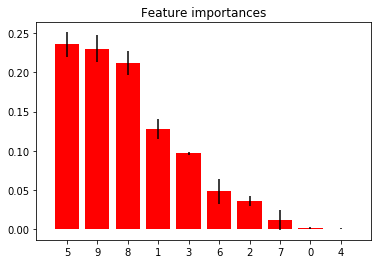

In [20]:
forest_reg.fit(X_train, y_train)
importances = forest_reg.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest_reg.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]
sorted(zip(importances, list(X_train)), reverse=True)
# Print the feature ranking
print("Feature ranking:")

for f in range(X_train.shape[1]):
    print("%d. %s: %f" % (f + 1, list(X_train)[indices[f]], importances[indices[f]]))
    
# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(X_train.shape[1]), indices)
plt.xlim([-1, X_train.shape[1]])
plt.show()

# Feature selection

In [25]:
from sklearn.feature_selection import SelectFromModel
print(X_train.shape)
model = SelectFromModel(forest_reg, prefit=True)
X_new = model.transform(X_train)
X_new.shape    

(3845, 10)


(3845, 4)

## For saving and loading a model

In [22]:
from sklearn.externals import joblib
joblib.dump(forest_reg, "forest_reg.pkl")
# and later...
my_model_loaded = joblib.load("forest_reg.pkl")